# Crop Productivity Analysis 

## Data

The following datasets are utilized in this analysis for calculating and mapping crop productivity over the past years:

1. **Dynamic World Dataset**:
   - **Source**: [Dynamic World - Google and the World Resources Institute (WRI)](https://dynamicworld.app/) 
   - **Description**:The Dynamic World dataset provides a near real-time, high-resolution (10-meter) global land cover classification. It is derived from Sentinel-2 imagery and utilizes machine learning models to classify land cover into nine distinct classes, including water, trees, grass, crops, built areas, bare ground, shrubs, flooded vegetation, and snow/ice. The dataset offers data with minimal latency, enabling near-immediate analysis and decision-making.
   - **Spatial Resolution**: 10 meters.
   - **Temporal Coverage**: Data is available since mid-2015, updated continuously as Sentinel-2 imagery becomes available capturing near Real-time.

2. **MODIS Dataset**:
   - **Source:** NASA's Moderate Resolution Imaging Spectroradiometer [MODIS](https://modis.gsfc.nasa.gov/data/) on Terra and Aqua satellites.
   - **Description:** The MODIS dataset provides a wide range of data products, including land surface temperature, vegetation indices, and land cover classifications. It is widely used for monitoring and modeling land surface processes.
   - **Spatial Resolution:** 250 meters.
   - **Temporal Coverage:** Data is available from 2000 to the present, with daily to 16-day composite products.

3. **Administrative Boundaries (HDX)**:
   - **Source**: Humanitarian Data Exchange [HDX](https://data.humdata.org/).
   - **Description**: Geographic boundaries used for spatial aggregation and administrative analysis, such as calculating productivity metrics by region (e.g., governorate or district).
   - **Use Case**: The administrative boundaries are used to aggregate EVI statistics by region and facilitate reporting at various administrative levels.


In [1]:
from pathlib import Path
import ast
from functools import reduce
import glob


import ee
import geemap
from gee_zonal import ZonalStats
import geopandas as gpd
import pandas as pd
import plotnine as p9
import altair as alt
import numpy as np
import rasterio
import matplotlib.pyplot as plt

PROJECT_ROOT = Path().cwd().parent.parent
DATA_PATH = PROJECT_ROOT / "data"
EVI_PATH = DATA_PATH / "EVI and Crop Land" / "EVI 2010-2025"
CROPLAND_PATH = DATA_PATH / "EVI and Crop Land" / "Crop Land"
BOUNDARIES_PATH = DATA_PATH / "Shapefiles"

ee.Initialize()

In [2]:
def bitwiseExtract(value: ee.Image, fromBit: int, toBit: int | None = None) -> ee.Image:
    """Extract bits from a binary image."""
    toBit = fromBit if toBit is None else toBit
    maskSize = ee.Number(1).add(toBit).subtract(fromBit)
    mask = ee.Number(1).leftShift(maskSize).subtract(1)
    return value.rightShift(fromBit).bitwiseAnd(mask)


def apply_modisQA_mask(image: ee.Image):
    sqa = image.select("SummaryQA")
    dqa = image.select("DetailedQA")
    viQualityFlagsS = bitwiseExtract(sqa, 0, 1)
    viQualityFlagsD = bitwiseExtract(dqa, 0, 1)
    viSnowIceFlagsD = bitwiseExtract(dqa, 14)
    # Good data, use with confidence
    mask = (
        viQualityFlagsS.eq(0)
        .And(viQualityFlagsD.eq(0))
        .And(viQualityFlagsS.eq(1))
        .And(viQualityFlagsD.eq(1))
        .And(viSnowIceFlagsD)
        .eq(0)
    )
    return image.updateMask(mask)


def apply_scale_factor(image, scale_factor: float = 0.0001) -> ee.Image:
    """Apply scale factor to an image."""
    scaled_evi = image.multiply(scale_factor).copyProperties(
        image, ["system:time_start"]
    )
    return scaled_evi


def load_evi_data(
    start_date: str | ee.Date,
    end_date: str | ee.Date,
) -> ee.ImageCollection:
    """
    Load EVI data from MODIS.

    Args:
        start_date: Start date.
        end_date: End date.
        apply_crop_mask: Whether to apply crop mask.

    Returns:
        EVI image collection.
    """

    terra = (
        ee.ImageCollection("MODIS/061/MOD13Q1")
        .select(["EVI", "SummaryQA", "DetailedQA"])
        .filterDate(start_date, end_date)
    )

    aqua = (
        ee.ImageCollection("MODIS/061/MYD13Q1")
        .select(["EVI", "SummaryQA", "DetailedQA"])
        .filterDate(start_date, end_date)
    )

    mod13q1_QC = terra.map(apply_modisQA_mask)
    myd13q1_QC = aqua.map(apply_modisQA_mask)
    mxd13q1_cleaned = (
        mod13q1_QC.select("EVI").merge(myd13q1_QC.select("EVI")).map(apply_scale_factor)
    )
    mxd13q1 = mxd13q1_cleaned.sort("system:time_start")
    return mxd13q1


def filter_growing_season(df: pd.DataFrame) -> pd.DataFrame:
    """
    Filter dataframe for growing seasons only.
    Growing season is defined as February to June
    """
    start_year = df["date"].dt.year.min()
    end_year = df["date"].dt.year.max()

    seasons = []
    for year in range(start_year, end_year + 1):
        # February to June of this year
        season_start = pd.Timestamp(f"{year}-07-01")
        season_end = pd.Timestamp(f"{year}-12-31")

        season_data = df.query("date >= @season_start and date <= @season_end").assign(
            year=pd.to_datetime(f"{year}-01-01")
        )

        seasons.append(season_data)

    return pd.concat(seasons, ignore_index=True)

In [3]:
adm0_shp = gpd.read_file(
    BOUNDARIES_PATH / "Boundaries" / "mmr_polbnda_adm0_250k_mimu.shp"
)
# Decided to use the following adm1 shapefiles instead because it is identical
# to the other `mmr_polbnda2_adm1_250k_mimu.shp` and has more regions
adm1_shp = gpd.read_file(
    BOUNDARIES_PATH / "mmr_polbnda2_adm1_250k_mimu" / "mmr_polbnda2_adm1_250k_mimu.shp"
)
adm2_shp = gpd.read_file(
    BOUNDARIES_PATH / "Boundaries" / "mmr_polbnda_adm2_250k_mimu_1.shp"
)
adm3_shp = gpd.read_file(
    BOUNDARIES_PATH / "mmr_polbnda_adm3_250k_mimu" / "mmr_polbnda_adm3_250k_mimu.shp"
)

adm0 = adm0_shp.pipe(geemap.geopandas_to_ee)
adm1 = adm1_shp.pipe(geemap.geopandas_to_ee)
adm2 = adm2_shp.pipe(geemap.geopandas_to_ee)
adm3 = adm3_shp.pipe(geemap.geopandas_to_ee)

start_date = ee.Date("2010-01-01")
end_date = ee.Date("2025-08-30")

evi_data = load_evi_data(start_date, end_date)

In [4]:
def create_cropland_mask_by_year(year: int):
    """
    Create cropland mask for a specific year using Dynamic World land cover.
    For years before 2015, uses 2015 mask as Dynamic World only starts in 2015.
    """
    cropland_value = 4

    # Dynamic World starts in 2015
    mask_year = max(year, 2015)

    yearly_start = ee.Date.fromYMD(mask_year, 1, 1)
    yearly_end = ee.Date.fromYMD(mask_year, 12, 31)

    yearly_lc = (
        ee.ImageCollection("GOOGLE/DYNAMICWORLD/V1")
        .filterDate(yearly_start, yearly_end)
        .filterBounds(adm0)
        .select("label")
        # Get the most frequent land cover class
        .reduce(ee.Reducer.mode())
    )

    crop_mask = yearly_lc.eq(cropland_value)
    return crop_mask


def create_evi_masked_by_year(year: int):
    """Create EVI collection masked to cropland for a specific year."""
    crop_mask = create_cropland_mask_by_year(year)

    evi_subset = evi_data.filterDate(
        ee.Date.fromYMD(year, 1, 1), ee.Date.fromYMD(year, 12, 31)
    )

    def apply_crop_mask(image):
        return image.updateMask(crop_mask).set("year", year)

    evi_masked = evi_subset.map(apply_crop_mask)
    return evi_masked

## Crop area statistics

In [5]:
run = False
if run:
    # Split into 3 batches to avoid timeout
    total_features = len(adm1_shp)
    batch_size = int(np.ceil(total_features / 3))

    for year in range(2015, 2026):
        print(f"Processing year {year}...")

        for batch_num in range(3):
            start_idx = batch_num * batch_size
            end_idx = min((batch_num + 1) * batch_size, total_features)

            print(
                f"  Batch {batch_num + 1}/3 (regions {start_idx} to {end_idx - 1})..."
            )

            try:
                crop_year = create_cropland_mask_by_year(year)

                adm1_batch_gdf = adm1_shp.iloc[start_idx:end_idx]
                adm1_batch = adm1_batch_gdf.pipe(geemap.geopandas_to_ee)

                zs = ZonalStats(
                    ee_dataset=crop_year,
                    target_features=adm1_batch,
                    scale=10,
                    statistic_type="count",
                    output_dir="Myanmar Crop Admin level 1",
                    output_name=f"myanmar_adm1_cropland_stats_{year}_batch{batch_num + 1}",
                )

                zs.runZonalStats()
                print(f"  ✓ Completed batch {batch_num + 1}")

            except Exception as e:
                print(f"  ✗ Error processing batch {batch_num + 1}: {str(e)}")
                continue

        print(f"✓ Completed year {year}")

In [6]:
run = False
if run:
    # Split into 5 batches to avoid timeout
    total_features = len(adm2_shp)
    batch_size = int(np.ceil(total_features / 5))

    for year in range(2015, 2026):
        print(f"Processing year {year}...")

        for batch_num in range(5):
            start_idx = batch_num * batch_size
            end_idx = min((batch_num + 1) * batch_size, total_features)

            print(
                f"  Batch {batch_num + 1}/5 (regions {start_idx} to {end_idx - 1})..."
            )
            try:
                crop_year = create_cropland_mask_by_year(year)
                adm2_batch_gdf = adm2_shp.iloc[start_idx:end_idx]
                adm2_batch = adm2_batch_gdf.pipe(geemap.geopandas_to_ee)

                zs = ZonalStats(
                    ee_dataset=crop_year,
                    target_features=adm2_batch,
                    scale=10,
                    statistic_type="count",
                    output_dir="Myanmar Crop Admin level 2",
                    output_name=f"myanmar_adm2_cropland_stats_{year}_batch{batch_num + 1}",
                )

                zs.runZonalStats()
                print(f"  ✓ Completed batch {batch_num + 1}")

            except Exception as e:
                print(f"✗ Error processing year {year}: {str(e)}")
                continue

        print(f"✓ Completed year {year}")

In [7]:
run = False
if run:
    # Split into 5 batches to avoid timeout
    total_features = len(adm3_shp)
    batch_size = int(np.ceil(total_features / 5))

    for year in range(2015, 2026):
        print(f"Processing year {year}...")

        for batch_num in range(5):
            start_idx = batch_num * batch_size
            end_idx = min((batch_num + 1) * batch_size, total_features)

            print(
                f"  Batch {batch_num + 1}/5 (regions {start_idx} to {end_idx - 1})..."
            )
            try:
                crop_year = create_cropland_mask_by_year(year)
                adm3_batch_gdf = adm3_shp.iloc[start_idx:end_idx]
                adm3_batch = adm3_batch_gdf.pipe(geemap.geopandas_to_ee)

                zs = ZonalStats(
                    ee_dataset=crop_year,
                    target_features=adm3_batch,
                    scale=10,
                    statistic_type="count",
                    output_dir="Myanmar Crop Admin level 3",
                    output_name=f"myanmar_adm3_cropland_stats_{year}_batch{batch_num + 1}",
                )

                zs.runZonalStats()
                print(f"  ✓ Completed batch {batch_num + 1}")

            except Exception as e:
                print(f"✗ Error processing year {year}: {str(e)}")
                continue

        print(f"✓ Completed year {year}")

In [8]:
def load_dict(input_str):
    input_str = input_str.replace("null", "'null'")
    input_str = input_str.replace("=", ":")
    result_dict = ast.literal_eval(input_str)
    return result_dict


crop_count_files = CROPLAND_PATH / "Admin level 1" / "MIMU"
dfs = []
for file in crop_count_files.glob("*.csv"):
    df = pd.read_csv(file).assign(
        year=file.stem.split("_")[-2],
        histogram=lambda df: df["histogram"].apply(load_dict),
    )
    dfs.append(df)

dfs = pd.concat(dfs, ignore_index=True)
dfs_area = (
    dfs.join(pd.json_normalize(dfs["histogram"]))
    .rename(columns={"null": "Other", 1: "crop_area", 0: "non_crop"})
    .fillna(0)
    .drop(columns=["histogram"])
    .loc[
        :,
        [
            "year",
            "ST",
            "ST_PCODE",
            "crop_area",
        ],
    ]
    .sort_values(["crop_area"], ascending=False)
)

df_area = (
    dfs_area.assign(
        year=lambda df: df["year"].astype(str),
        # Each pixel is 10m x 10m = 100 m²; convert to hectares (1 ha = 10,000 m²)
        crop_area=lambda df: (df["crop_area"] * 100 / 10000),
    )
    .pivot(
        index=["ST", "ST_PCODE"],
        columns="year",
        values="crop_area",
    )
    .reset_index()
    .assign(
        pct_change_2015_2025=lambda df: (
            (df["2025"] - df["2015"]) / df["2015"] * 100
        ).round(2),
        abs_pct_change_2015_2025=lambda df: abs(df["pct_change_2015_2025"]),
    )
    .replace([float("inf"), np.nan], 0)
)

df_area

year,ST,ST_PCODE,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025,pct_change_2015_2025,abs_pct_change_2015_2025
0,Ayeyarwady,MMR017,477942.32,1009678.36,954663.77,1261435.06,1311810.16,1284046.32,1247190.42,1121293.16,1226005.62,1389561.03,1185667.23,148.08,148.08
1,Bago (East),MMR007,3294.37,608582.53,543046.08,621584.45,670502.51,675028.17,644528.49,601213.74,618735.61,648606.09,612430.37,18490.21,18490.21
2,Bago (West),MMR008,309351.34,491240.77,367560.25,450867.93,448473.15,463751.74,449620.93,431668.40,477498.07,494897.33,442237.44,42.96,42.96
3,Chin,MMR004,6177.81,6063.89,4553.30,6903.56,7678.94,8095.11,9689.67,9303.55,9993.43,7979.08,10230.50,65.60,65.60
4,Kachin,MMR001,99817.44,153638.94,146787.56,208298.06,215060.70,214885.32,235396.18,206727.07,238279.18,206585.79,164590.06,64.89,64.89
5,Kayah,MMR002,0.00,20870.50,11974.69,19136.63,29618.37,36523.40,35107.18,18593.04,26612.66,17123.81,10242.61,0.00,0.00
6,Kayin,MMR003,11609.83,64663.09,46086.23,72767.34,79971.46,104488.84,76099.37,61563.70,76369.14,91577.32,82406.40,609.80,609.80
7,Magway,MMR009,739612.49,816549.69,735884.61,913400.55,894306.55,911785.61,994914.20,929419.18,996177.03,897861.60,832402.33,12.55,12.55
8,Mandalay,MMR010,802809.95,904037.35,791819.02,958015.75,993341.16,994492.70,1026028.82,996693.03,1070520.65,954644.79,919394.40,14.52,14.52
9,Mon,MMR011,7608.89,106187.88,88132.59,125061.23,161287.14,168289.23,142500.95,143364.64,150291.13,186830.50,178099.30,2240.67,2240.67


In [9]:
(
    df_area.filter(
        [
            "ST",
            "ST_PCODE",
            "2015",
            "2025",
            "pct_change_2015_2025",
            "abs_pct_change_2015_2025",
        ]
    )
    .sort_values("2025", ascending=False)
    .rename(
        columns={
            "ST": "Name",
            "ST_PCODE": "PCODE",
            "2015": "Crop Area (ha) in 2015",
            "2025": "Crop Area (ha) in 2025",
            "pct_change_2015_2025": "% Change in Crop Area (2015-2025)",
            "abs_pct_change_2015_2025": "Absolute % Change in Crop Area (2015-2025)",
        }
    )
)

,Name,PCODE,Crop Area (ha) in 2015,Crop Area (ha) in 2025,% Change in Crop Area (2015-2025),Absolute % Change in Crop Area (2015-2025)
12,Sagaing,MMR005,897012.27,1355659.42,51.13,51.13
0,Ayeyarwady,MMR017,477942.32,1185667.23,148.08,148.08
8,Mandalay,MMR010,802809.95,919394.40,14.52,14.52
7,Magway,MMR009,739612.49,832402.33,12.55,12.55
1,Bago (East),MMR007,3294.37,612430.37,18490.21,18490.21
17,Yangon,MMR013,1962.76,469040.30,23796.98,23796.98
2,Bago (West),MMR008,309351.34,442237.44,42.96,42.96
15,Shan (South),MMR014,4505.87,300314.13,6564.95,6564.95
9,Mon,MMR011,7608.89,178099.30,2240.67,2240.67
4,Kachin,MMR001,99817.44,164590.06,64.89,64.89


In [11]:
(
    alt.Chart(dfs_area, title="Crop Area in Myanmar by Admin Level 1 (2015-2025)")
    .mark_line(point=True)
    .encode(
        x="year:T",
        y="crop_area:Q",
        tooltip=["year:T", "crop_area:Q"],
        facet=alt.Facet("ST:N", columns=4, title=None),
    )
    .properties(width=160, height=100)
    .resolve_scale(y="independent")
)

alt.Chart(...)

## Crop Seasonality

Using this time series dataset of EVI images, we apply several pre-processing steps to extract critical phenological parameters: start of season (SOS), middle of season (MOS), end of season (EOS), length of season (LOS), etc. This workflow is heavily inspired by the [TIMESAT](https://web.nateko.lu.se/timesat/timesat.asp) software.

**Pre-processing steps**  
1. Remove outliers from dataset on per-pixel basis using median method: outlier if median from a moving window < or > standard deviation of time-series times 2.
2. Interpolate missing values linearly
3. Smooth data on per-pixel basis (using Savitsky Golay filter, window length of 3, and polyorder of 1)  

**Phenology Process**  
We then extract crop seasonality metrics using the seasonal amplitude method from the phenolopy package. 

The chart below shows the result of this process for a single crop pixel. The blue dots represent the raw EVI values, the black line represents the processed EVI values, and the dotted lines represent season parameters extracted for that pixel: start of season, peak of season, and end of season.

In [12]:
run = False
if run:
    for year in range(2010, 2026):
        print(f"Processing year {year}...")

        try:
            evi_year = create_evi_masked_by_year(year)

            zs = ZonalStats(
                ee_dataset=evi_year,
                target_features=adm0,
                scale=250,
                statistic_type="median",
                output_dir="Admin level 0",
                output_name=f"myanmar_adm0_evi_stats_{year}",
            )

            zs.runZonalStats()

            print(f"✓ Completed year {year}")

        except Exception as e:
            print(f"✗ Error processing year {year}: {str(e)}")
            continue

In [17]:
def preprocess_evi(evi_file: str | Path) -> pd.DataFrame:
    """Preprocess EVI CSV file."""
    evi_df = pd.read_csv(evi_file)

    metadata_cols = [
        col
        for col in evi_df.columns
        for word in ["Name", "OBJECTID", "ST", "DT", "PCode", ".geo"]
        if word in col
    ]
    evi_df = (
        evi_df.rename(columns=lambda col: col[-14:] if col.endswith("_EVI") else col)
        .drop(columns=["system:index"])
        .melt(
            id_vars=metadata_cols,
            var_name="band_date",
            value_name="EVI",
        )
        .assign(
            date=lambda df: pd.to_datetime(
                df["band_date"].str.extract(r"(\d{4}_\d{2}_\d{2})")[0],
                format="%Y_%m_%d",
            ),
        )
    )
    return evi_df


evi_adm0_df = (
    pd.concat(
        [
            preprocess_evi(
                DATA_PATH
                / "EVI and Crop Land"
                / "EVI 2010-2025"
                / "Admin level 0"
                / "MIMU"
                / f"myanmar_adm0_evi_stats_{year}.csv"
            )
            for year in range(2010, 2026)
        ],
    )
    .drop(columns=[".geo"])
    .merge(adm0_shp.filter(["OBJECTID", "geometry"]), on="OBJECTID", how="left")
    .sort_values(["date"])
    .reset_index(drop=True)
    .assign(
        month=lambda df: df["date"].dt.to_period("M").dt.to_timestamp(),
        year=lambda df: df["date"].dt.to_period("Y").dt.to_timestamp(),
    )
    .set_index("date")
)

evi_adm0_df.head()

,Name,OBJECTID,band_date,EVI,geometry,month,year
date,,,,,,,
2010-01-01,Myanmar,1,2010_01_01_EVI,0.236283,"MULTIPOLYGON (((98.10918 9.70499, 98.10823 9.7...",2010-01-01,2010-01-01
2010-01-09,Myanmar,1,2010_01_09_EVI,0.224585,"MULTIPOLYGON (((98.10918 9.70499, 98.10823 9.7...",2010-01-01,2010-01-01
2010-01-17,Myanmar,1,2010_01_17_EVI,0.222585,"MULTIPOLYGON (((98.10918 9.70499, 98.10823 9.7...",2010-01-01,2010-01-01
2010-01-25,Myanmar,1,2010_01_25_EVI,0.208972,"MULTIPOLYGON (((98.10918 9.70499, 98.10823 9.7...",2010-01-01,2010-01-01
2010-02-02,Myanmar,1,2010_02_02_EVI,0.201165,"MULTIPOLYGON (((98.10918 9.70499, 98.10823 9.7...",2010-02-01,2010-01-01


In [18]:
from scipy.signal import savgol_filter


def preprocess_series(series):
    """TIMESAT-style preprocessing."""
    series = series.interpolate(limit_direction="both")  # Step 2: Interpolate
    median = series.rolling(window=5, center=True).median()
    std_dev = series.std()
    series = series.mask(
        (series - median).abs() > 2 * std_dev
    )  # Step 1: Remove outliers
    series = series.interpolate(limit_direction="both")
    smoothed = savgol_filter(series, window_length=5, polyorder=2)  # Step 3: Smooth
    return smoothed


def extract_sos_mos_eos(smoothed, dates, threshold=0.2):
    max_val = smoothed.max()
    min_val = smoothed.min()
    amp = max_val - min_val
    sos = mos = eos = None
    for i in range(1, len(smoothed)):
        if sos is None and smoothed[i] > min_val + threshold * amp:
            sos = dates[i]
        if smoothed[i] == max_val:
            mos = dates[i]
        if sos is not None and smoothed[i] < min_val + threshold * amp:
            eos = dates[i]
            break
    return sos, mos, eos

In [19]:
seasonality_data = (
    evi_adm0_df.assign(month=lambda df: df.index.month)
    .groupby("month")
    .agg(EVI=("EVI", "mean"))
    .assign(smoothed=lambda df: preprocess_series(df["EVI"]))
    .assign(
        sos=lambda df: extract_sos_mos_eos(df["smoothed"].values, df.index)[0],
        mos=lambda df: extract_sos_mos_eos(df["smoothed"].values, df.index)[1],
        eos=lambda df: extract_sos_mos_eos(df["smoothed"].values, df.index)[2],
    )
    .reset_index()
    .assign(
        smoothed=lambda df: df["smoothed"].round(3), EVI=lambda df: df["EVI"].round(3)
    )
)

base = alt.Chart(seasonality_data)

points = base.mark_circle(color="steelblue", size=60).encode(
    x=alt.X(
        "month:O",
        scale=alt.Scale(domain=list(range(1, 13))),
        axis=alt.Axis(
            labelExpr="['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'][datum.value-1]",
            title="",
        ),
    ),
    y=alt.Y("EVI:Q"),
    tooltip=["month:O", "EVI:Q"],
)

line = base.mark_line(color="black").encode(
    x="month:O", y=alt.Y("smoothed:Q"), tooltip=["month:O", "smoothed:Q"]
)

sos_line = (
    base.mark_rule(strokeDash=[5, 5], color="gray")
    .encode(x="sos:O")
    .transform_filter(alt.expr.isValid(alt.datum.sos))
)

mos_line = (
    base.mark_rule(strokeDash=[5, 5], color="gray")
    .encode(x="mos:O")
    .transform_filter(alt.expr.isValid(alt.datum.mos))
)

eos_line = (
    base.mark_rule(strokeDash=[5, 5], color="gray")
    .encode(x="eos:O")
    .transform_filter(alt.expr.isValid(alt.datum.eos))
)


chart = (
    (points + line + sos_line + mos_line + eos_line)
    .properties(title="Crop Seasonality based on EVI", width=600, height=400)
    .interactive()
)

chart

alt.LayerChart(...)

Based on the phenology process, we identified the seasonality to start in February and end in June with the peak being in March. This can vary with geographic region and crop type as well, however, that has not been taken into consideration in this version.

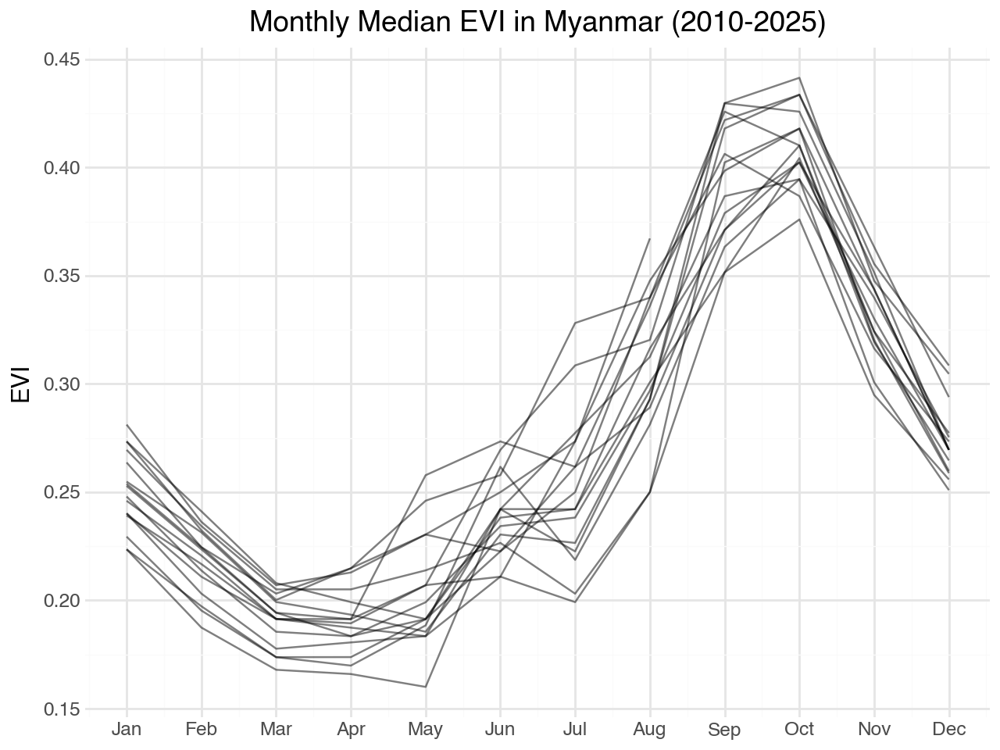

In [20]:
monthly_evi = (
    evi_adm0_df.groupby(pd.Grouper(freq="MS"))
    .agg(EVI=("EVI", "median"))
    .assign(month=lambda x: x.index.month, year=lambda x: x.index.year)
)

(
    p9.ggplot(monthly_evi)
    + p9.aes(x="month", y="EVI", group="year")
    + p9.geom_line(alpha=0.5)
    + p9.theme_minimal()
    + p9.scale_x_continuous(
        breaks=range(1, 13),
        labels=[
            "Jan",
            "Feb",
            "Mar",
            "Apr",
            "May",
            "Jun",
            "Jul",
            "Aug",
            "Sep",
            "Oct",
            "Nov",
            "Dec",
        ],
    )
    + p9.labs(title="Monthly Median EVI in Myanmar (2010-2025)", x="")
)

The following figure shows the median EVI in Syria from 2010 to 2025 during the crop growing season (February to June). The shaded area represents the interquartile range (IQR) of EVI values across all pixels, indicating the variability in vegetation health during this period.

In [21]:
evi_adm0_median = (
    evi_adm0_df.reset_index()
    .pipe(filter_growing_season)
    .groupby("year", as_index=False)
    .agg(EVI=("EVI", "median"))
    .assign(EVI=lambda df: df["EVI"].round(3))
)

(
    alt.Chart(evi_adm0_median, title="Median EVI in Myanmar (2010-2025)")
    .mark_line(point=True)
    .encode(
        x=alt.X("year:T", title=""),
        y=alt.Y("EVI:Q"),
        tooltip=["year:T", "EVI:Q"],
    )
    .properties(title="Median EVI in Myanmar (2010-2025)", width=600, height=300)
    .interactive()
)

alt.Chart(...)

## Trends in EVI

### Admin level 1

In [22]:
run = False
if run:
    # Split into 3 batches to avoid timeout
    total_features = len(adm1_shp)
    batch_size = int(np.ceil(total_features / 3))

    for year in range(2010, 2026):
        print(f"Processing year {year}...")

        for batch_num in range(3):
            start_idx = batch_num * batch_size
            end_idx = min((batch_num + 1) * batch_size, total_features)

            print(
                f"  Batch {batch_num + 1}/3 (regions {start_idx} to {end_idx - 1})..."
            )

            try:
                evi_year = create_evi_masked_by_year(year)

                adm1_batch_gdf = adm1_shp.iloc[start_idx:end_idx]
                adm1_batch = adm1_batch_gdf.pipe(geemap.geopandas_to_ee)

                zs = ZonalStats(
                    ee_dataset=evi_year,
                    target_features=adm1_batch,
                    scale=250,
                    statistic_type="median",
                    output_dir="Admin level 1",
                    output_name=f"myanmar_adm1_evi_stats_{year}_batch{batch_num + 1}",
                )

                zs.runZonalStats()
                print(f"  ✓ Completed batch {batch_num + 1}")

            except Exception as e:
                print(f"  ✗ Error processing batch {batch_num + 1}: {str(e)}")
                continue

        print(f"✓ Completed year {year}")

In [24]:
evi_adm1_df = (
    pd.concat(
        [
            preprocess_evi(
                DATA_PATH
                / "EVI and Crop Land"
                / "EVI 2010-2025"
                / "Admin level 1"
                / "MIMU"
                / f"myanmar_adm1_evi_stats_{year}_batch{batch_num}.csv"
            )
            for year in range(2010, 2026)
            for batch_num in range(1, 4)
        ],
    )
    .drop(columns=[".geo"])
    .merge(adm1_shp.filter(["ST_PCODE", "geometry"]), on="ST_PCODE", how="left")
    .sort_values(["date"])
    .reset_index(drop=True)
)
evi_adm1_df.head()

,OBJECTID,PCode_V,ST,ST_MMR,ST_PCODE,ST_RG,band_date,EVI,date,geometry
0,1,9.3,Ayeyarwady,á§áá¬ááá®áá­á¯ááºá¸áá±áá...,MMR017,Region,2010_01_01_EVI,0.365227,2010-01-01,"MULTIPOLYGON (((95.20798 15.6904, 95.21097 15...."
1,18,9.3,Yangon,áááºáá¯ááºáá­á¯ááºá¸áá±á...,MMR013,Region,2010_01_01_EVI,0.455600,2010-01-01,"MULTIPOLYGON (((93.37067 14.1523, 93.37167 14...."
2,17,9.3,Tanintharyi,ááááºá¹áá¬áá®áá­á¯ááºá¸á...,MMR006,Region,2010_01_01_EVI,0.365200,2010-01-01,"MULTIPOLYGON (((98.10918 9.70499, 98.10823 9.7..."
3,16,9.3,Shan (South),áá¾ááºá¸áá¼ááºáááº (áá±á...,MMR014,State,2010_01_01_EVI,0.231493,2010-01-01,"POLYGON ((96.96958 22.26812, 96.97358 22.26669..."
4,15,9.3,Shan (North),áá¾ááºá¸áá¼ááºáááº (áá¼á...,MMR015,State,2010_01_01_EVI,0.247851,2010-01-01,"POLYGON ((96.66869 24.14981, 96.66784 24.14561..."


The figure below shows the trends of median EVI from 2010-2025 on admin level 1.

In [25]:
evi_adm1_median = (
    evi_adm1_df.pipe(filter_growing_season)
    .groupby(["year", "ST_PCODE", "ST"], as_index=False)
    .agg(EVI=("EVI", "median"))
    .assign(EVI=lambda df: df["EVI"].round(3))
    .rename(columns={"ST": "Name"})
)


(
    alt.Chart(
        evi_adm1_median, title="Median EVI in Myanmar by Admin Level 1 (2010-2025)"
    )
    .mark_line(point=True)
    .encode(
        x="year:T",
        y="EVI:Q",
        tooltip=["year:T", "EVI:Q"],
        facet=alt.Facet("Name:N", columns=4, title=None),
    )
    .properties(width=160, height=100)
)

alt.Chart(...)

The figure below shows a choropleth maps of EVI for each admin level 1 from 2010-2025

In [26]:
(
    alt.Chart(
        evi_adm1_median.assign(year=lambda df: df["year"].dt.year),
        title="Median EVI in Myanmar by Admin Level 1 (2010-2025)",
    )
    .mark_geoshape(stroke="white", strokeWidth=1.5)
    .encode(
        shape="geo:G",
        color="EVI:Q",
        tooltip=["Name:N", "EVI:Q"],
        facet=alt.Facet("year:N", columns=4, title=None),
    )
    .transform_lookup(
        lookup="ST_PCODE",
        from_=alt.LookupData(data=adm1_shp, key="ST_PCODE"),
        as_="geo",
    )
    .properties(width=200, height=200)
)

alt.Chart(...)

The figure below shows the percent change of EVI compared to previous year from 2010-2025 on admin level 1.

In [27]:
evi_adm1_pct_change = evi_adm1_median.sort_values(["ST_PCODE", "year"]).assign(
    EVI_pct_change=lambda df: df.groupby(["ST_PCODE", "Name"])["EVI"].pct_change(),
)
(
    alt.Chart(
        evi_adm1_pct_change,
        title="EVI Percentage Change in Myanmar by Admin Level 1 (2010-2025)",
    )
    .mark_line(point=True)
    .encode(
        x="year:T",
        y=alt.Y(
            "EVI_pct_change:Q", axis=alt.Axis(format=".1%"), title="Percentage Change"
        ),
        tooltip=[
            "year:T",
            alt.Tooltip("EVI_pct_change:Q", format=".1%", title="EVI % Change"),
        ],
        facet=alt.Facet("Name:N", columns=4, title=None),
    )
    .properties(width=160, height=100)
)

/var/folders/q1/wt8mfyzs73l2r5977rk_mkxm0000gn/T/ipykernel_58317/2542661506.py:2: FutureWarning: The default fill_method='ffill' in SeriesGroupBy.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.


alt.Chart(...)

### Admin level 2

In [28]:
run = False
if run:
    # Split into 5 batches to avoid timeout
    total_features = len(adm2_shp)
    batch_size = int(np.ceil(total_features / 5))

    for year in range(2010, 2026):
        print(f"Processing year {year}...")

        for batch_num in range(5):
            start_idx = batch_num * batch_size
            end_idx = min((batch_num + 1) * batch_size, total_features)

            print(
                f"  Batch {batch_num + 1}/5 (regions {start_idx} to {end_idx - 1})..."
            )

            try:
                evi_year = create_evi_masked_by_year(year)

                adm2_batch_gdf = adm2_shp.iloc[start_idx:end_idx]
                adm2_batch = adm2_batch_gdf.pipe(geemap.geopandas_to_ee)

                zs = ZonalStats(
                    ee_dataset=evi_year,
                    target_features=adm2_batch,
                    scale=250,
                    statistic_type="median",
                    output_dir="Admin level 2",
                    output_name=f"myanmar_adm2_evi_stats_{year}_batch{batch_num + 1}",
                )

                zs.runZonalStats()
                print(f"  ✓ Completed batch {batch_num + 1}")

            except Exception as e:
                print(f"  ✗ Error processing batch {batch_num + 1}: {str(e)}")
                continue

        print(f"✓ Completed year {year}")

In [30]:
evi_adm2_df = (
    pd.concat(
        [
            preprocess_evi(
                DATA_PATH
                / "EVI and Crop Land"
                / "EVI 2010-2025"
                / "Admin level 2"
                / "MIMU"
                / f"myanmar_adm2_evi_stats_{year}_batch{batch_num}.csv"
            )
            for year in range(2010, 2026)
            for batch_num in range(1, 6)
        ],
    )
    .drop(columns=[".geo"])
    .merge(adm2_shp.filter(["DT_PCODE", "geometry"]), on="DT_PCODE", how="left")
    .sort_values(["date", "DT"])
)
evi_adm2_df.head()

,DT,DT_MMR,DT_PCODE,OBJECTID,PCode_V,ST,ST_PCODE,band_date,EVI,date,geometry
6,Bago,áá²áá°á¸ááá­á¯ááº,MMR007D001,7,9.3,Bago (East),MMR007,2010_01_01_EVI,NaN,2010-01-01,"POLYGON ((95.90674 18.49065, 95.90675 18.48704..."
738,Bawlake,áá±á¬ááá²ááá­á¯ááº,MMR002D002,19,9.3,Kayah,MMR002,2010_01_01_EVI,NaN,2010-01-01,"POLYGON ((97.52785 19.33398, 97.52965 19.33218..."
14,Bhamo,áááºá¸áá±á¬áºááá­á¯ááº,MMR001D003,15,9.3,Kachin,MMR001,2010_01_01_EVI,0.287205,2010-01-01,"POLYGON ((97.19794 24.90224, 97.19794 24.90224..."
2217,Danu Self-Administered Zone,ááá¯ áá­á¯ááºáá­á¯ááºá¡á¯...,MMR014S001,69,9.3,Shan (South),MMR014,2010_01_01_EVI,0.229666,2010-01-01,"POLYGON ((96.7883 21.71785, 96.78986 21.71199,..."
2222,Dawei,áá¬á¸áááºááá­á¯ááº,MMR006D001,74,9.3,Tanintharyi,MMR006,2010_01_01_EVI,0.270300,2010-01-01,"MULTIPOLYGON (((98.13216 13.53152, 98.13064 13..."


In [31]:
evi_adm2_median = (
    evi_adm2_df.pipe(filter_growing_season)
    .groupby(["year", "DT_PCODE", "DT"], as_index=False)
    .agg(EVI=("EVI", "median"))
    .assign(EVI=lambda df: df["EVI"].round(3))
    .rename(columns={"DT": "Name"})
)

options = evi_adm2_median["Name"].unique().tolist()

input_dropdown = alt.binding_select(options=options, name="Region ")

selection = alt.selection_point(fields=["Name"], bind=input_dropdown, value=options[0])

(
    alt.Chart(
        evi_adm2_median, title="Median EVI in Myanmar by Admin Level 2 (2010-2025)"
    )
    .mark_line(point=True)
    .encode(
        x="year:T",
        y="EVI:Q",
        tooltip=["year:T", "EVI:Q"],
        color=alt.Color("Name:N"),
    )
    .add_params(selection)
    .transform_filter(selection)
    .properties(width=500, height=300)
)

alt.Chart(...)

The figure below shows a choropleth maps of EVI for each admin level 2 from 2010-2025

In [32]:
(
    alt.Chart(
        evi_adm2_median, title="Median EVI in Myanmar by Admin Level 2 (2010-2025)"
    )
    .mark_geoshape(stroke="white", strokeWidth=1)
    .encode(
        shape="geo:G",
        color="EVI:Q",
        tooltip=["Name:N", "EVI:Q"],
        facet=alt.Facet("year:N", columns=4),
    )
    .transform_lookup(
        lookup="DT_PCODE",
        from_=alt.LookupData(data=adm2_shp, key="DT_PCODE"),
        as_="geo",
    )
    .properties(width=250, height=250)
    .interactive()
)

alt.Chart(...)

### Admin level 3

In [ ]:
run = False
if run:
    # Split into 5 batches to avoid timeout
    total_features = len(adm3_shp)
    batch_size = int(np.ceil(total_features / 5))

    for year in range(2010, 2026):
        print(f"Processing year {year}...")

        for batch_num in range(5):
            start_idx = batch_num * batch_size
            end_idx = min((batch_num + 1) * batch_size, total_features)

            print(
                f"  Batch {batch_num + 1}/5 (regions {start_idx} to {end_idx - 1})..."
            )

            try:
                evi_year = create_evi_masked_by_year(year)

                adm3_batch_gdf = adm3_shp.iloc[start_idx:end_idx]
                adm3_batch = adm3_batch_gdf.pipe(geemap.geopandas_to_ee)

                zs = ZonalStats(
                    ee_dataset=evi_year,
                    target_features=adm3_batch,
                    scale=250,
                    statistic_type="median",
                    output_dir="Admin level 3",
                    output_name=f"myanmar_adm3_evi_stats_{year}_batch{batch_num + 1}",
                )

                zs.runZonalStats()
                print(f"  ✓ Completed batch {batch_num + 1}")

            except Exception as e:
                print(f"  ✗ Error processing batch {batch_num + 1}: {str(e)}")
                continue

        print(f"✓ Completed year {year}")

In [ ]:
evi_adm3_df = (
    pd.concat(
        [
            preprocess_evi(
                DATA_PATH
                / "EVI 2010-2025"
                / "Admin level 3"
                / f"syria_adm3_evi_stats_{year}.csv"
            )
            for year in range(2010, 2026)
        ],
    )
    .drop(columns=[".geo"])
    .merge(adm3_shp.filter(["PCODE", "geometry"]), on="PCODE", how="left")
    .sort_values(["date", "NAME_EN"])
    .reset_index(drop=True)
)

In [ ]:
evi_adm3_median = (
    evi_adm3_df.pipe(filter_growing_season)
    .groupby(["year", "PCODE", "NAME_EN"], as_index=False)
    .agg(EVI=("EVI", "median"))
    .assign(EVI=lambda df: df["EVI"].round(3))
    .rename(columns={"NAME_EN": "Name"})
)

options = evi_adm3_median["Name"].unique().tolist()

input_dropdown = alt.binding_select(options=options, name="Region ")

selection = alt.selection_point(fields=["Name"], bind=input_dropdown, value=options[0])

(
    alt.Chart(evi_adm3_median, title="Median EVI in Syria by Admin Level 3 (2010-2025)")
    .mark_line(point=True)
    .encode(
        x="year:T",
        y="EVI:Q",
        tooltip=["year:T", "EVI:Q"],
        color=alt.Color("Name:N"),
    )
    .add_params(selection)
    .transform_filter(selection)
    .properties(width=500, height=300)
)

The figure below shows a choropleth maps of EVI for each admin level 3 from 2010-2025

In [ ]:
def complete_cases(
    df: pd.DataFrame, group_cols: list[str], value_col: str
) -> pd.DataFrame:
    """Make sure all combinations of group_cols are present, and fill missing values with 0."""
    complete_df = (
        pd.MultiIndex.from_product(
            [df[col].unique() for col in group_cols],
            names=group_cols,
        )
        .to_frame(index=False)
        .merge(df, on=group_cols, how="left")
        .fillna({value_col: 0})
    )
    return complete_df


evi_adm3_median = (
    evi_adm3_df.pipe(filter_growing_season)
    .assign(year=lambda df: df["year"].dt.year)
    .groupby(["NAME_EN", "PCODE", "year"], as_index=False)
    .agg(EVI=("EVI", "median"))
    .assign(EVI=lambda df: df["EVI"].round(3))
    .rename(columns={"NAME_EN": "Name"})
    .pipe(complete_cases, group_cols=["PCODE", "year"], value_col="EVI")
)

(
    alt.Chart(evi_adm3_median, title="Median EVI in Syria by Admin Level 3 (2010-2025)")
    .mark_geoshape(stroke="white", strokeWidth=0.5)
    .encode(
        shape="geo:G",
        color="EVI:Q",
        tooltip=["Name:N", "EVI:Q"],
        facet=alt.Facet("year:N", columns=4, title=None),
    )
    .transform_lookup(
        lookup="PCODE",
        from_=alt.LookupData(data=syria_adm3_shp, key="PCODE"),
        as_="geo",
    )
    .properties(width=170, height=170)
    .interactive()
)